141
16
                       Item  Item Code   Y1994   Y1995   Y1996   Y1997  \
0       Barley and products       2513    5112    4046    4877    3282   
1            Cereals, Other       2520      96      67      49      76   
2        Maize and products       2514  142272  122850  137762  142238   
3       Millet and products       2517     152     128     171     154   
4                      Oats       2516    4584    4018    3762    3972   
5  Rice (Milled Equivalent)       2805    2046    2236    2151    2284   
6          Rye and products       2515     259     235     211     213   
7      Sorghum and products       2518   10605    7718   13360    9572   
8        Wheat and products       2511   32471   29845   32121   30756   

    Y1998   Y1999   Y2000   Y2001  ...   Y2005   Y2006   Y2007   Y2008  \
0    3664    3156    2834    2428  ...    1187    1233     817    1584   
1      76      58      61      52  ...     138     141     162     195   
2  142321  147163  151722  152

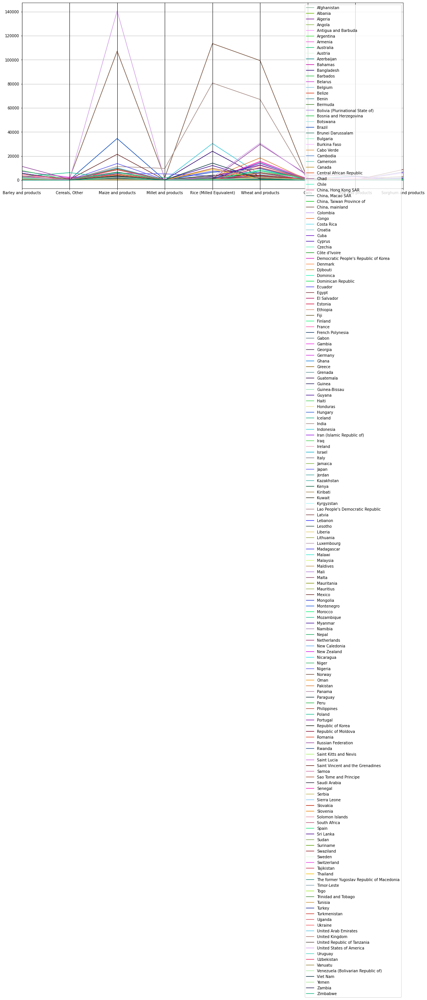

                                   Area  Barley and products  Cereals, Other  \
0                           Afghanistan             0.022617        0.000041   
1                               Albania             0.000492        0.000114   
2                               Algeria             0.093660        0.000767   
3                                Angola             0.000000        0.000000   
4                   Antigua and Barbuda             0.000000        0.000000   
..                                  ...                  ...             ...   
169  Venezuela (Bolivarian Republic of)             0.000374        0.002888   
170                            Viet Nam             0.000000        0.000204   
171                               Yemen             0.002896        0.000408   
172                              Zambia             0.000000        0.000049   
173                            Zimbabwe             0.000593        0.000555   

     Maize and products  Millet and pro

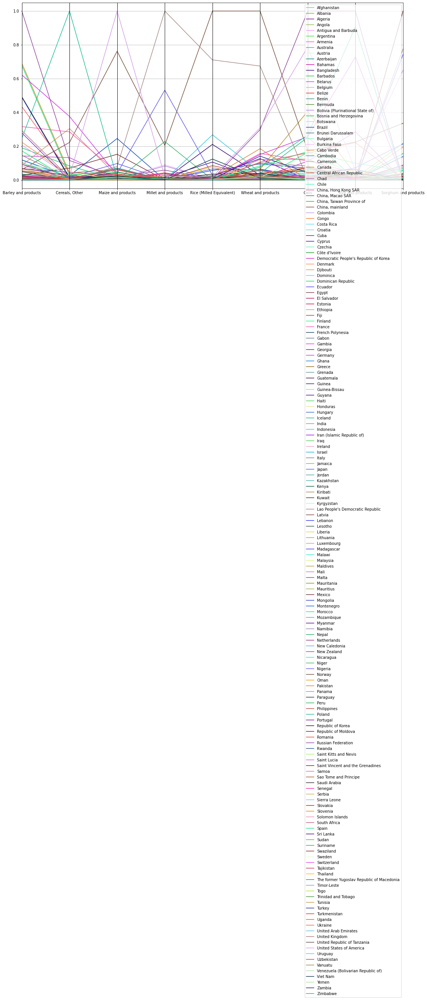

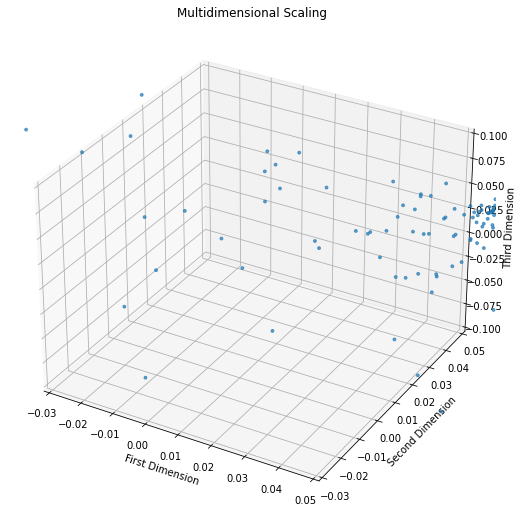

In [2]:
import pandas as pd;
import numpy as np;
import matplotlib.pyplot as plt;
from sklearn import preprocessing;
from sklearn.manifold import MDS;
from sklearn.decomposition import PCA;
from sklearn.cluster import KMeans;
from sklearn.mixture import GaussianMixture;
import scipy;
import random;
import copy;


def cleanDF(acceptable_array, column_name, data_frame):
    comparator = list(map(lambda element: element in acceptable_array, data_frame[column_name]))
    cleanedDF = data_frame[comparator]
    return cleanedDF

def dropYears(data_frame, drop_years, final_year):
    drop_array = []
    
    for col in data_frame.columns:
        
        if "Y" in col:
            if final_year - int(col[1:]) >= drop_years:
                drop_array.append(col)
        
            
    data_frame = data_frame.drop(drop_array, axis = 1)
    return data_frame

def yieldAvg(data_frame):
    drop_array = []
    
    for col in data_frame.columns:
        
        if "Y" not in col:
            drop_array.append(col)
            
    data_frame_mean = data_frame.drop(drop_array, axis = 1)
    

    data_frame_mean["Average Yield"] = data_frame_mean.mean(axis=1)
    
    return(data_frame.join(data_frame_mean["Average Yield"]))
    
def parallel(full_data_frame, pdata_frame, key, dictionary, key_col):
     
    
    key_df = full_data_frame[full_data_frame[key_col]==key]
    temp_dict = copy.deepcopy(dictionary)
    for cereal in dictionary.keys():

        try:
            avgYield = key_df[key_df["Item"]==cereal]["Average Yield"].iloc[0]
        except:
            avgYield = 0
        temp_dict.update({"Area":key,cereal:[avgYield]})
        
    temp_df = pd.DataFrame(data=temp_dict)

    pdata_frame = pdata_frame.append(temp_df, ignore_index=True)
    return pdata_frame    





# Problem 1
# Acceptable Cereals:
cereal_types = [
    "Wheat", "Rice", "Barley", "Maize", "Rye", "Oats", "Millet", "Sorghum", "Cereals, Other"]

cereal_codes = [
    2511, 2805, 2513, 2514, 2515, 2516, 2517, 2518, 2520]


# Import USAFAO
USAFAO_data = pd.read_csv("USAFAO.csv")

# Clean up data
cleaned_USAFAO = cleanDF(cereal_codes, 'Item Code', USAFAO_data)

print(len(USAFAO_data['Item']))
print(len(cleaned_USAFAO['Item']))

# Prepare data to for merging of feed and food
drop_array = ['Area Abbreviation', 'Area','Area Code', 'Element Code', 'Element', 'Unit', 'latitude', 'longitude']
grouped_USAFAO = cleaned_USAFAO.drop(drop_array, axis = 1)
grouped_USAFAO = grouped_USAFAO.groupby(['Item','Item Code']).sum().reset_index()

# Create Yield over last 20 years column
mean_USAFAO = dropYears(grouped_USAFAO, 20, 2013)
mean_USAFAO = yieldAvg(mean_USAFAO)

print((mean_USAFAO))

# # Problem 2

# Import FAO
FAO_data = pd.read_csv("FAO.csv",encoding='latin1')

# Clean up data
cleaned_FAO = cleanDF(cereal_codes, 'Item Code', FAO_data)

print(len(FAO_data['Item']))
print(len(cleaned_FAO['Item']))

# Prepare data to for merging of feed and food
drop_array = ['Area Abbreviation', 'Element Code', 'Element', 'Unit', 'latitude', 'longitude']
grouped_FAO = cleaned_FAO.drop(drop_array, axis = 1)
grouped_FAO = grouped_FAO.groupby(['Area','Area Code','Item','Item Code',]).sum().reset_index()
# print(grouped_FAO.head(20))

# Create Yield over last 20 years column
mean_FAO = dropYears(grouped_FAO, 20, 2013)
mean_FAO = yieldAvg(mean_FAO)

print(mean_FAO.head(20))

# Problem 3 Data Exploration

#Set up data for parallel coordinates (Column of Countries, Columns of cerals, cells of YA)
dict_cereals = dict.fromkeys(mean_FAO['Item'])

parallel_FAO = mean_FAO[mean_FAO['Area']=="Null"]['Area'].to_frame()
key_col = "Area"

unique_areas = dict.fromkeys(mean_FAO['Area']).keys()

for key in unique_areas:

    parallel_FAO = parallel(mean_FAO, parallel_FAO, key, dict_cereals, key_col)
    
# for key in dict_temp.keys():
#     cleanDF([], key, mean_FAO)
# data_temp = pd.
# Parallel Coordinates of Ceral vs average yield
xTicks = list(dict_cereals.keys())
xTicks.append("Area")

plt.rcParams['figure.figsize'] = [len(cereal_types)*2, len(cereal_types)]
pd.plotting.parallel_coordinates(parallel_FAO[xTicks], 'Area')
print(parallel_FAO)
plt.show()

# Normalize Data

min_max_scaler = preprocessing.MinMaxScaler()

norm_FAO = copy.deepcopy(parallel_FAO)

for cereal in xTicks[0:len(xTicks)-1]:
    x_scaled = min_max_scaler.fit_transform(parallel_FAO[cereal].values.reshape(-1, 1))
    temp_df = pd.DataFrame(x_scaled, columns =[cereal])
    norm_FAO.update(temp_df)

print(norm_FAO)
pd.plotting.parallel_coordinates(norm_FAO[xTicks], 'Area')

plt.show()

# Run MDS on the data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
# for area in xTicks[0:len(xTicks)-1]:
#     temp = norm_FAO["pos"] == cat
focused_data = norm_FAO.drop('Area', axis=1)
emb = MDS(n_components=3)
    
fitted_x = emb.fit_transform(focused_data.values)
#     colorize = dict(c=fitted_x[:, 0], cmap=plt.cm.get_cmap('rainbow', 3))
    
ax.scatter(fitted_x[:,0],fitted_x[:,1],fitted_x[:,2], s=8)


plt.axis([-0.03, 0.05, -0.03, 0.05])
ax.set_zlim(-.1, .1)
# plt.legend()
ax.set_xlabel("First Dimension")
ax.set_ylabel("Second Dimension")
ax.set_zlabel("Third Dimension")
plt.title("Multidimensional Scaling")
          
plt.show()  
emb_ar = []

# # Run PCA on Data
# fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')
# for cat in player_pos:
#     temp = normalized_Data["pos"] == cat
#     focused_data = normalized_Data[temp].drop('pos', axis=1)
#     emb = PCA(n_components=3)
#     emb_ar.append([emb,cat])
#     fitted_x = emb.fit_transform(focused_data.values)
# #     colorize = dict(c=fitted_x[:, 0], cmap=plt.cm.get_cmap('rainbow', 3))
    
#     ax.scatter(fitted_x[:,0],fitted_x[:,1],fitted_x[:,2], label = cat)


# plt.axis([-5, 5, -5, 5])
# plt.legend()
# ax.set_xlabel("First PC")
# ax.set_ylabel("Second PC")
# ax.set_zlabel("Third PC")
# plt.title("Principal Component Analysis")
# plt.show() 

# for emb in emb_ar:
#     plt.bar(range(len(emb[0].explained_variance_ratio_)),emb[0].explained_variance_ratio_, label = emb[1])
#     plt.legend()
#     plt.axis([-.5, 2.5, 0, 1])
#     plt.show()



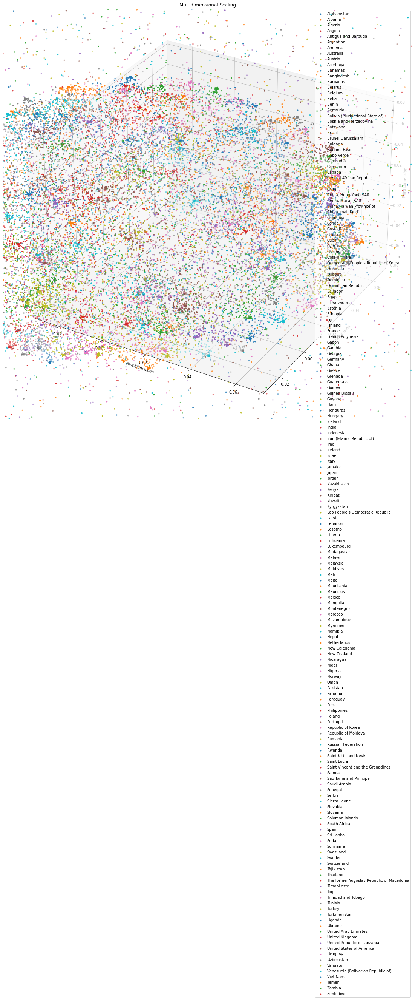

In [61]:
# Run MDS on the data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
mds_array=[]
for area in unique_areas:
    temp = norm_FAO[norm_FAO["Area"] == area]
    focused_data = norm_FAO.drop('Area', axis=1)
    emb = MDS(n_components=3)
    
    fitted_x = emb.fit_transform(focused_data.values)
    mds_array.append(fitted_x)
#     colorize = dict(c=fitted_x[:, 0], cmap=plt.cm.get_cmap('rainbow', 3))
    
    ax.scatter(fitted_x[:,0],fitted_x[:,1],fitted_x[:,2], s=8, label = area)


plt.axis([-0.03, 0.07, -0.03, 0.07])
ax.set_zlim(-.08, .08)
plt.legend()
ax.set_xlabel("First Dimension")
ax.set_ylabel("Second Dimension")
ax.set_zlabel("Third Dimension")
plt.title("Multidimensional Scaling")
fig.set_size_inches(20,20)

plt.show()  
emb_ar = []


No handles with labels found to put in legend.


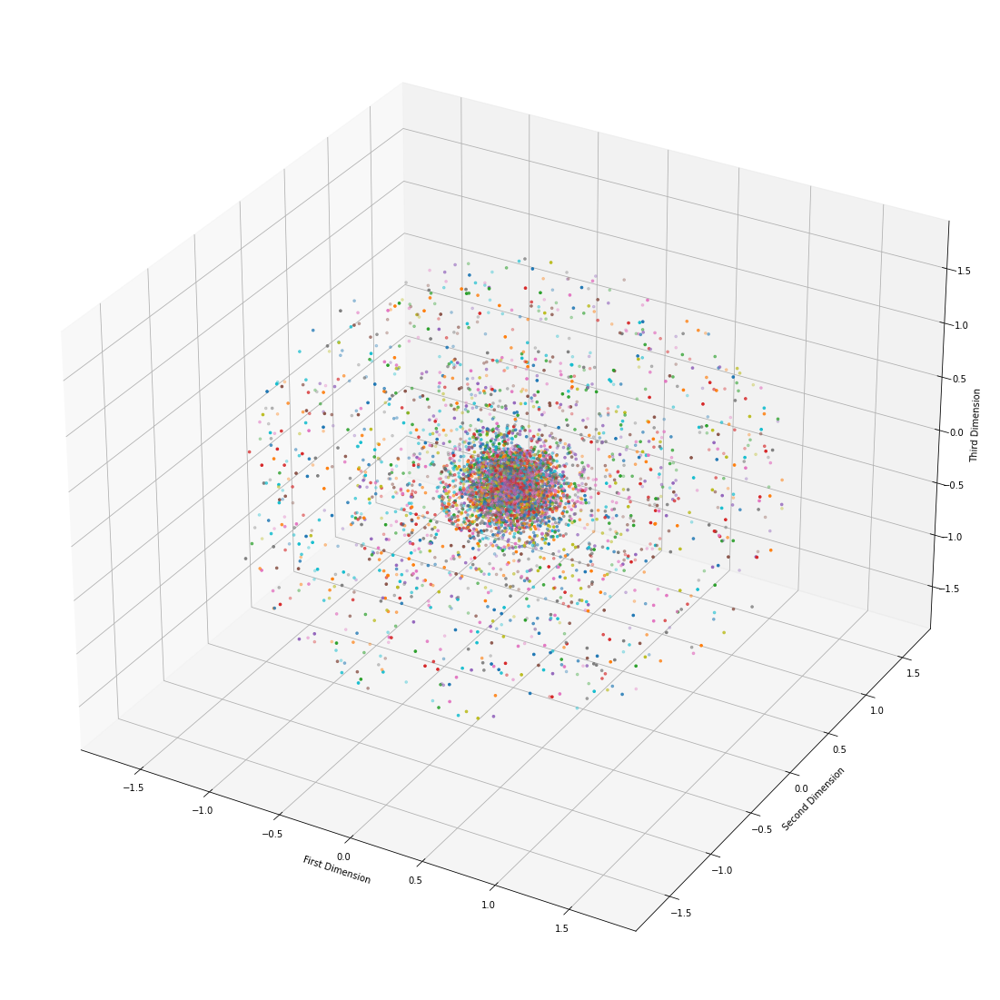

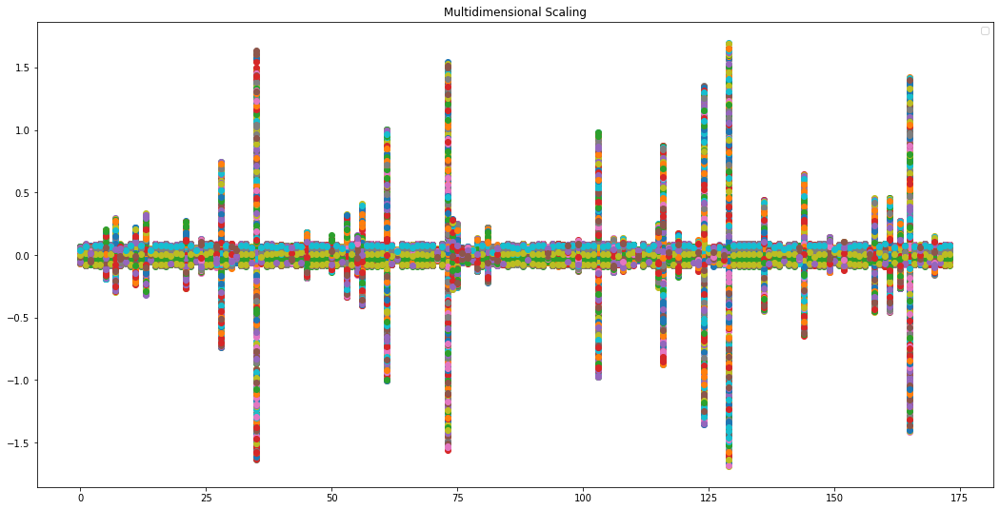

In [8]:
# Run Kmeans on the data
fig = plt.figure(0)
ax = fig.add_subplot(111, projection='3d')
fig2 = plt.figure(1)
ax2 = fig2.add_subplot(111)
# for area in unique_areas:
#     temp = norm_FAO[norm_FAO["Area"] == area]
colors = ["blue", "green", "red",'yellow','cyan', 'magenta', 'orange','purple', 'black']

for i in range(len(mds_array)):
    focused_data = mds_array[i]
#     focused_data = MDS(7).fit_transform(focused_data)
    grp = GaussianMixture(3)
    grp.fit(focused_data)
    yhat = grp.predict(focused_data)
    clusters = np.unique(yhat)

    j = 0

    for cluster in clusters:
        row_ix = np.where(yhat == cluster)
        
        ax.scatter(focused_data[row_ix,0],focused_data[row_ix,1],focused_data[row_ix,2], s=7)
        ax2.scatter(row_ix,focused_data[row_ix,0])
        ax2.scatter(row_ix,focused_data[row_ix,1])
        ax2.scatter(row_ix,focused_data[row_ix,2])        
        
        j+=1


# plt.axis([-0.04, 0.04, -0.04, 0.08])
# ax.set_zlim(-.08, .05)
plt.legend()
ax.set_xlabel("First Dimension")
ax.set_ylabel("Second Dimension")
ax.set_zlabel("Third Dimension")
plt.title("Multidimensional Scaling")
fig.set_size_inches(20,20)

plt.show()   
emb_ar = []


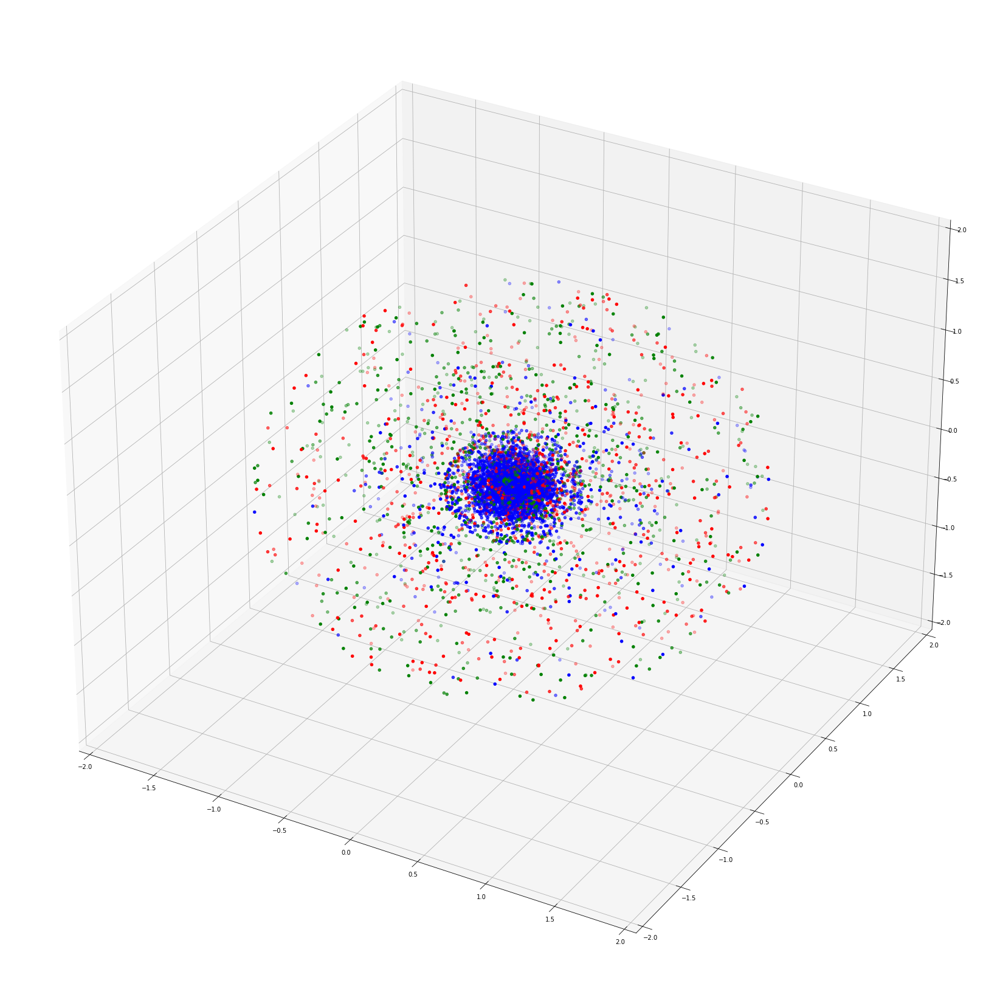

In [74]:
# Run MDS on the data
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

for i in range(len(mds_array)):

    focused_data = mds_array[i]
#     focused_data = MDS(n_components=3).fit_transform(focused_data)
    kmeans = KMeans(n_clusters=3)
    yhat = kmeans.fit_predict(focused_data)
    fitted_x = KMeans(n_clusters=8).fit_transform(focused_data)
    temp = focused_data
    temp = pd.DataFrame(temp,columns=["First","Second","Third"])
    temp['clusters'] = yhat

    df1 = temp[temp['clusters']==0]
    df2 = temp[temp['clusters']==1]
    df3 = temp[temp['clusters']==2]
    df4 = temp[temp['clusters']==3]
    df5 = temp[temp['clusters']==4]
    df6 = temp[temp['clusters']==5]
    df7 = temp[temp['clusters']==6]
    df8 = temp[temp['clusters']==7]
    
    ax.scatter(df1['First'],df1['Second'],df1['Third'],c="blue")
    ax.scatter(df2['First'],df2['Second'],df2['Third'],c="red")
    ax.scatter(df3['First'],df3['Second'],df3['Third'],c="green")
    ax.scatter(df4['First'],df4['Second'],df4['Third'],c="pink")
    ax.scatter(df5['First'],df5['Second'],df5['Third'],c="yellow")
    ax.scatter(df6['First'],df6['Second'],df6['Third'],c="cyan")
    ax.scatter(df7['First'],df7['Second'],df7['Third'],c="black")
    ax.scatter(df8['First'],df8['Second'],df8['Third'],c="orange")


# plt.axis([-.07, .07, -.07, .07])
# ax.set_zlim(-.07, 0.07)
plt.axis([-2, 2, -2, 2])
ax.set_zlim(-2, 2)

# plt.legend()
# ax.set_xlabel("First Dimension")
# ax.set_ylabel("Second Dimension")
# ax.set_zlabel("Third Dimension")
# plt.title("Multidimensional Scaling")
fig.set_size_inches(30,30)

plt.show()  
emb_ar = []


[[ 1.34384725 -0.50186748  2.25226527 ... -0.44298915 -0.58342597
  -0.69230234]
 [-0.60581084 -0.70858958 -0.61977852 ... -0.63175871 -0.5676062
  -0.70249103]
 [-0.43763959  0.21012767 -0.26090752 ... -0.50176159  2.71593116
   2.07073334]
 ...
 [-0.60933292  1.42475046 -0.20793001 ... -0.65175937 -0.56788471
  -0.79190027]
 [-0.60933292 -0.40868169 -0.61899302 ... -0.65942492 -0.57877042
  -0.84908   ]
 [-0.60933292 -0.77104886 -0.63514439 ...  2.44404744  0.14755149
   1.26393339]]


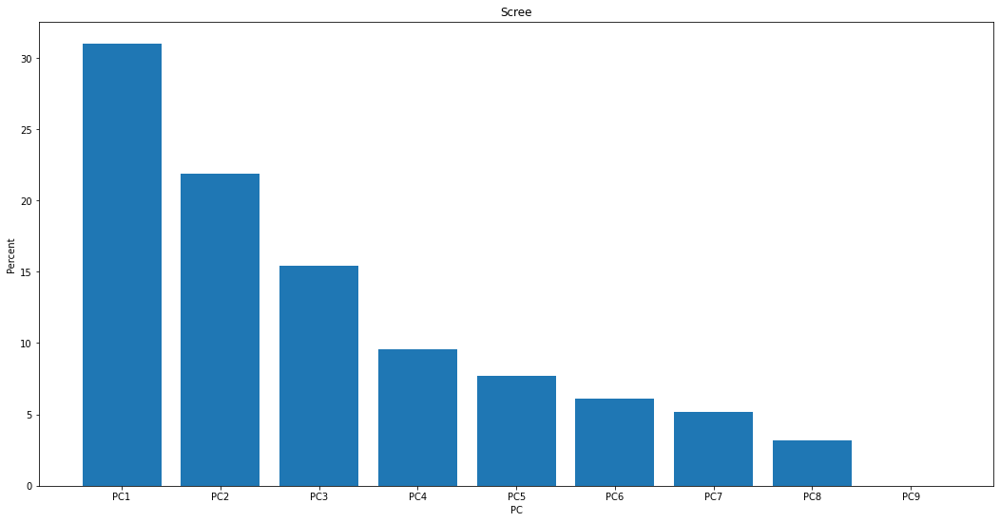

In [33]:
focused_data = norm_FAO.drop('Area', axis=1)
scaled_data = preprocessing.scale(focused_data.T.values)
print(scaled_data)
pca = PCA()
pca.fit(scaled_data)
pca_data = pca.transform(scaled_data)
per_var = np.round(pca.explained_variance_ratio_*100, decimals=1)
labels = ['PC' + str(x) for x in range(1, len(per_var)+1)]

plt.bar(x=range(1,len(per_var)+1), height=per_var, tick_label=labels)
plt.ylabel('Percent')
plt.xlabel("PC")
plt.title("Scree")
plt.show()

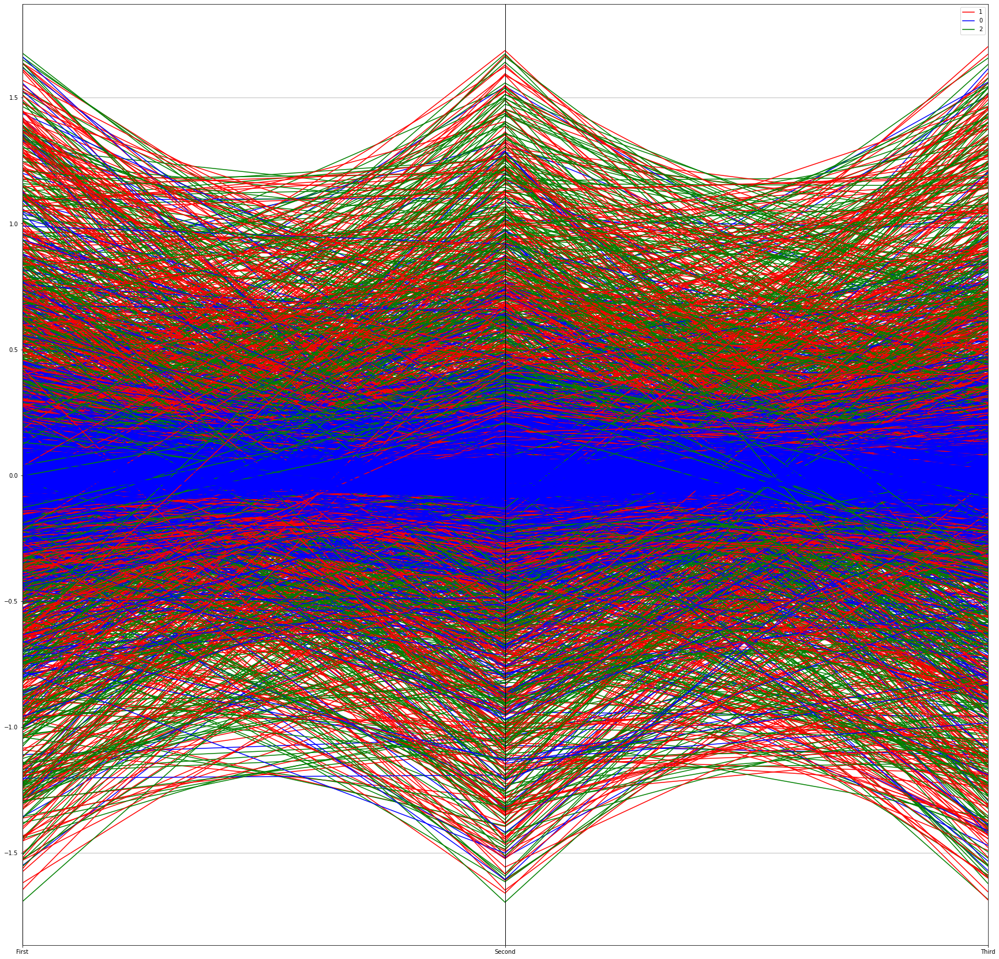

In [81]:
# Run Parallel on the data
fig = plt.figure()
# ax = fig.add_subplot(111, projection='3d')

large_frame = pd.DataFrame(columns = ["First","Second","Third", "clusters"])

for i in range(len(mds_array)):

    focused_data = mds_array[i]
#     focused_data = MDS(n_components=3).fit_transform(focused_data)
    kmeans = KMeans(n_clusters=3)
    yhat = kmeans.fit_predict(focused_data)
    fitted_x = KMeans(n_clusters=8).fit_transform(focused_data)
    temp = focused_data
    temp = pd.DataFrame(temp,columns=["First","Second","Third"])
    temp['clusters'] = yhat

    df1 = temp[temp['clusters']==0]
    df2 = temp[temp['clusters']==1]
    df3 = temp[temp['clusters']==2]
    df4 = temp[temp['clusters']==3]
    df5 = temp[temp['clusters']==4]
    df6 = temp[temp['clusters']==5]
    df7 = temp[temp['clusters']==6]
    df8 = temp[temp['clusters']==7]
    large_frame=large_frame.append(temp, ignore_index=True)
    
pd.plotting.parallel_coordinates(large_frame, 'clusters', color=('red','blue','green'))
    

# plt.axis([-.07, .07, -.07, .07])
# ax.set_zlim(-.07, 0.07)
# plt.axis([-2, 2, -2, 2])
# ax.set_zlim(-2, 2)

# plt.legend()
# ax.set_xlabel("First Dimension")
# ax.set_ylabel("Second Dimension")
# ax.set_zlabel("Third Dimension")
# plt.title("Multidimensional Scaling")
fig.set_size_inches(30,30)

plt.show()  
emb_ar = []
